In [ ]:
!pip install torch_snippets torch_summary --quiet
import itertools
from PIL import Image
from torch_snippets import *
from torchvision import transforms
from torchvision.utils import make_grid
from torchsummary import summary

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.6/79.6 kB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.5/62.5 kB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 10.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 204.2/204.2 kB 12.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.4/4.4 MB 10.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 41.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.9/98.9 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 62.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 30.6/30.6 MB 45.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.4/177.4 kB 10.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 61.7 MB/s eta 0

In [ ]:
# prompt: mount drive

from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
!unzip '/content/drive/MyDrive/HW_06 Dataset-20240316T220735Z-001.zip'

Streaming output truncated to the last 5000 lines.
  inflating: HW_06 Dataset/trainB/2016-04-12 08_05_37.jpg  
  inflating: HW_06 Dataset/trainB/2016-04-06 12_51_21.jpg  
  inflating: HW_06 Dataset/trainB/2016-04-25 06_43_45.jpg  
  inflating: HW_06 Dataset/trainB/2016-05-08 12_06_58.jpg  
  inflating: HW_06 Dataset/trainB/2016-05-25 12_08_10.jpg  
  inflating: HW_06 Dataset/trainB/2016-04-17 22_49_51.jpg  
  inflating: HW_06 Dataset/trainB/2016-05-06 10_02_21.jpg  
  inflating: HW_06 Dataset/trainB/2016-05-09 10_55_11.jpg  
  inflating: HW_06 Dataset/trainB/2016-05-21 06_00_05.jpg  
  inflating: HW_06 Dataset/trainB/2016-03-31 22_09_48.jpg  
  inflating: HW_06 Dataset/trainB/2016-04-20 03_27_00.jpg  
  inflating: HW_06 Dataset/trainB/2016-03-30 21_24_12.jpg  
  inflating: HW_06 Dataset/trainB/2016-04-03 22_01_12.jpg  
  inflating: HW_06 Dataset/trainB/2016-04-22 04_01_58.jpg  
  inflating: HW_06 Dataset/trainB/2016-04-28 11_05_20.jpg  
  inflating: HW_06 Dataset/trainB/2016-03-05 12_3

Looking at what the shape of our training images are

In [ ]:
img = Image.open('HW_06 Dataset/trainA/00342.jpg')
img.size

(256, 256)

Defining image transformations (augmentation)

In [ ]:
IMAGE_SIZE = 256
device = 'cuda' if torch.cuda.is_available() else 'cpu'
transform = transforms.Compose([
    transforms.Resize(int(IMAGE_SIZE*1.33)),
    transforms.RandomCrop((IMAGE_SIZE,IMAGE_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

Making our Train and Test Dataset

In [ ]:
class Monet2PhotoDataset(Dataset):
    def __init__(self, monets, photos):
        ### getting the list of images
        self.monets = Glob(monets)
        self.photos = Glob(photos)

    def __getitem__(self, ix):
        monet = self.monets[ix % len(self.monets)]
        ### Choosing a random photo image to pair with the chosen monet image
        photo = choose(self.photos)
        monet = Image.open(monet).convert('RGB')
        photo = Image.open(photo).convert('RGB')
        return monet, photo

    def __len__(self): return max(len(self.monets), len(self.photos))
    def choose(self): return self[randint(len(self))]

    def collate_fn(self, batch): #batch function
        ### The zip function breaks the tuples into two lists
        srcs, trgs = list(zip(*batch))

        srcs = torch.cat([transform(img)[None] for img in srcs], 0).to(device).float()
        trgs = torch.cat([transform(img)[None] for img in trgs], 0).to(device).float()
        return srcs.to(device), trgs.to(device)

Initializing the Data Loader

In [ ]:
trn_ds = Monet2PhotoDataset('HW_06 Dataset/trainA', 'HW_06 Dataset/trainB')
val_ds = Monet2PhotoDataset('HW_06 Dataset/testA', 'HW_06 Dataset/testB')

trn_dl = DataLoader(trn_ds, batch_size=1, shuffle=True, collate_fn=trn_ds.collate_fn)
val_dl = DataLoader(val_ds, batch_size=5, shuffle=True, collate_fn=val_ds.collate_fn)

Defining our CYCLE GAN

In [ ]:
def weights_init_normal(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
        if hasattr(m, "bias") and m.bias is not None:
            torch.nn.init.constant_(m.bias.data, 0.0)
    elif classname.find("BatchNorm2d") != -1:
        torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0.0)

Defining a Residual Block¶

In [ ]:
class ResidualBlock(nn.Module):
    def __init__(self, in_features):
        super(ResidualBlock, self).__init__()

        self.block = nn.Sequential(
            nn.ReflectionPad2d(1),
            nn.Conv2d(in_features, in_features, 3),
            nn.InstanceNorm2d(in_features),
            nn.ReLU(inplace=True),
            nn.ReflectionPad2d(1),
            nn.Conv2d(in_features, in_features, 3),
            nn.InstanceNorm2d(in_features),
        )

    def forward(self, x):
        return x + self.block(x)

Generator Class

In [ ]:
class GeneratorResNet(nn.Module):
    def __init__(self, num_residual_blocks=9):
        super(GeneratorResNet, self).__init__()
        out_features = 64
        channels = 3
        model = [
            nn.ReflectionPad2d(3),
            nn.Conv2d(channels, out_features, 7),
            nn.InstanceNorm2d(out_features),
            nn.ReLU(inplace=True),
        ]
        in_features = out_features
        # Downsampling
        for _ in range(2):
            out_features *= 2
            model += [
                nn.Conv2d(in_features, out_features, 3, stride=2, padding=1),
                nn.InstanceNorm2d(out_features),
                nn.ReLU(inplace=True),
            ]
            in_features = out_features

        # Residual blocks
        for _ in range(num_residual_blocks):
            model += [ResidualBlock(out_features)]

        # Upsampling
        for _ in range(2):
            out_features //= 2
            model += [
                nn.Upsample(scale_factor=2),
                nn.Conv2d(in_features, out_features, 3, stride=1, padding=1),
                nn.InstanceNorm2d(out_features),
                nn.ReLU(inplace=True),
            ]
            in_features = out_features

        # Output layer
        model += [nn.ReflectionPad2d(channels), nn.Conv2d(out_features, channels, 7), nn.Tanh()]
        self.model = nn.Sequential(*model)
        self.apply(weights_init_normal)
    def forward(self, x):
        return self.model(x)

Discriminator Class

In [ ]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        channels, height, width = 3, IMAGE_SIZE, IMAGE_SIZE

        def discriminator_block(in_filters, out_filters, normalize=True):
            """Returns downsampling layers of each discriminator block"""
            layers = [nn.Conv2d(in_filters, out_filters, 4, stride=2, padding=1)]
            if normalize:
                layers.append(nn.InstanceNorm2d(out_filters))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        self.model = nn.Sequential(
            *discriminator_block(channels, 64, normalize=False),
            *discriminator_block(64, 128),
            *discriminator_block(128, 256),
            *discriminator_block(256, 512),
            nn.ZeroPad2d((1, 0, 1, 0)),
            nn.Conv2d(512, 1, 4, padding=1)
        )
        self.apply(weights_init_normal)

    def forward(self, img):
        return self.model(img)

How do we generate samples from our Cycle GAN

In [ ]:
@torch.no_grad()
def generate_sample():
    data = next(iter(val_dl))
    G_AB.eval()
    G_BA.eval()

    real_A, real_B = data
    fake_B = G_AB(real_A)
    fake_A = G_BA(real_B)
    # Arange images along x-axis
    real_A = make_grid(real_A, nrow=5, normalize=True)
    real_B = make_grid(real_B, nrow=5, normalize=True)
    fake_A = make_grid(fake_A, nrow=5, normalize=True)
    fake_B = make_grid(fake_B, nrow=5, normalize=True)
    # Arange images along y-axis
    image_grid = torch.cat((real_A, fake_B, real_B, fake_A), 1)
    show(image_grid.detach().cpu().permute(1,2,0).numpy(), sz=12)

Defining the Generator Training Step

In [ ]:
def generator_train_step(Gs, optimizer, real_A, real_B):
    G_AB, G_BA = Gs
    optimizer.zero_grad()
    loss_id_A = criterion_identity(G_BA(real_A), real_A)
    loss_id_B = criterion_identity(G_AB(real_B), real_B)

    loss_identity = (loss_id_A + loss_id_B) / 2
    fake_B = G_AB(real_A)
    loss_GAN_AB = criterion_GAN(D_B(fake_B), torch.Tensor(np.ones((len(real_A), 1, 16, 16))).to(device))
    fake_A = G_BA(real_B)
    loss_GAN_BA = criterion_GAN(D_A(fake_A), torch.Tensor(np.ones((len(real_A), 1, 16, 16))).to(device))

    loss_GAN = (loss_GAN_AB + loss_GAN_BA) / 2
    recov_A = G_BA(fake_B)
    loss_cycle_A = criterion_cycle(recov_A, real_A)
    recov_B = G_AB(fake_A)
    loss_cycle_B = criterion_cycle(recov_B, real_B)

    loss_cycle = (loss_cycle_A + loss_cycle_B) / 2
    loss_G = loss_GAN + lambda_cyc * loss_cycle + lambda_id * loss_identity
    loss_G.backward()
    optimizer.step()
    return loss_G, loss_identity, loss_GAN, loss_cycle, loss_G, fake_A, fake_B

Defining the Discriminator Training Step

In [ ]:
def discriminator_train_step(D, real_data, fake_data, optimizer):
    optimizer.zero_grad()
    loss_real = criterion_GAN(D(real_data), torch.Tensor(np.ones((len(real_data), 1, 16, 16))).to(device))
    loss_fake = criterion_GAN(D(fake_data.detach()), torch.Tensor(np.zeros((len(real_data), 1, 16, 16))).to(device))
    loss_D = (loss_real + loss_fake) / 2
    loss_D.backward()
    optimizer.step()
    return loss_D

In [ ]:
G_AB = GeneratorResNet().to(device)
G_BA = GeneratorResNet().to(device)
D_A = Discriminator().to(device)
D_B = Discriminator().to(device)

criterion_GAN = torch.nn.MSELoss()
criterion_cycle = torch.nn.L1Loss()
criterion_identity = torch.nn.L1Loss()

optimizer_G = torch.optim.Adam(
    itertools.chain(G_AB.parameters(), G_BA.parameters()), lr=0.0002, betas=(0.5, 0.999)
)
optimizer_D_A = torch.optim.Adam(D_A.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_D_B = torch.optim.Adam(D_B.parameters(), lr=0.0002, betas=(0.5, 0.999))

lambda_cyc, lambda_id = 10.0, 5.0

Training the CYCLE GAN. Increase the number of epochs for better results

EPOCH: 1.000  loss_D: 0.065  loss_G: 4.377  loss_GAN: 0.603  loss_cycle: 0.254  loss_identity: 0.247  (3793.93s - 34145.39s remaining)

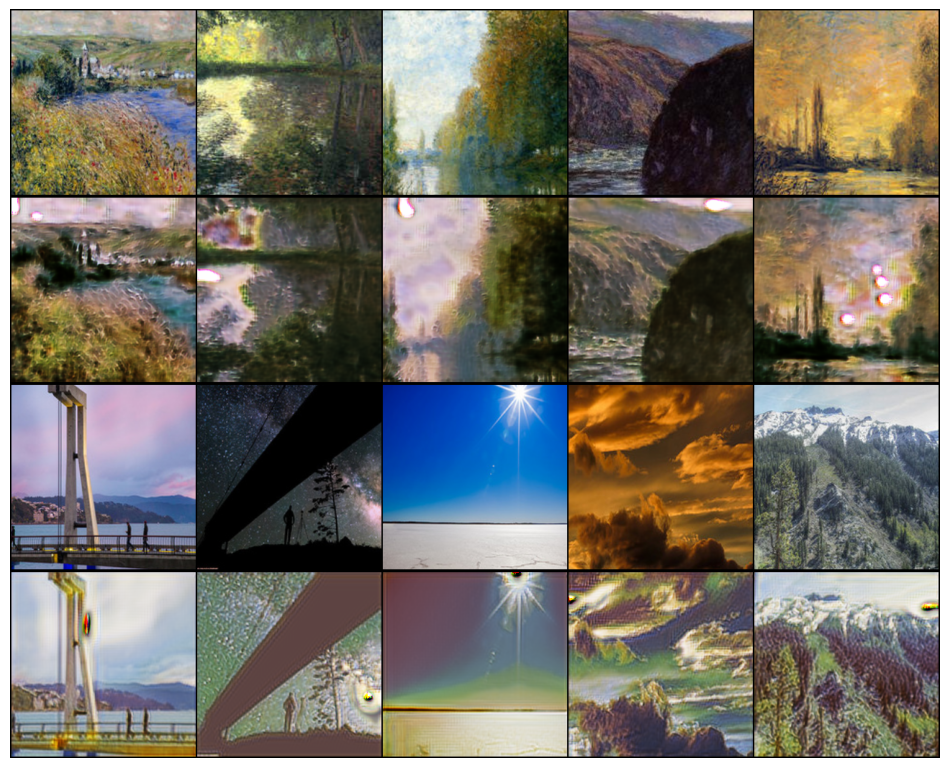

EPOCH: 1.000  loss_G: 4.209  loss_cycle: 0.251  loss_GAN: 0.546  loss_D: 0.205  loss_identity: 0.231  (3795.18s - 34156.59s remaining)
EPOCH: 2.000  loss_D: 0.092  loss_G: 3.049  loss_GAN: 0.453  loss_cycle: 0.181  loss_identity: 0.157  (7592.68s - 30370.72s remaining)

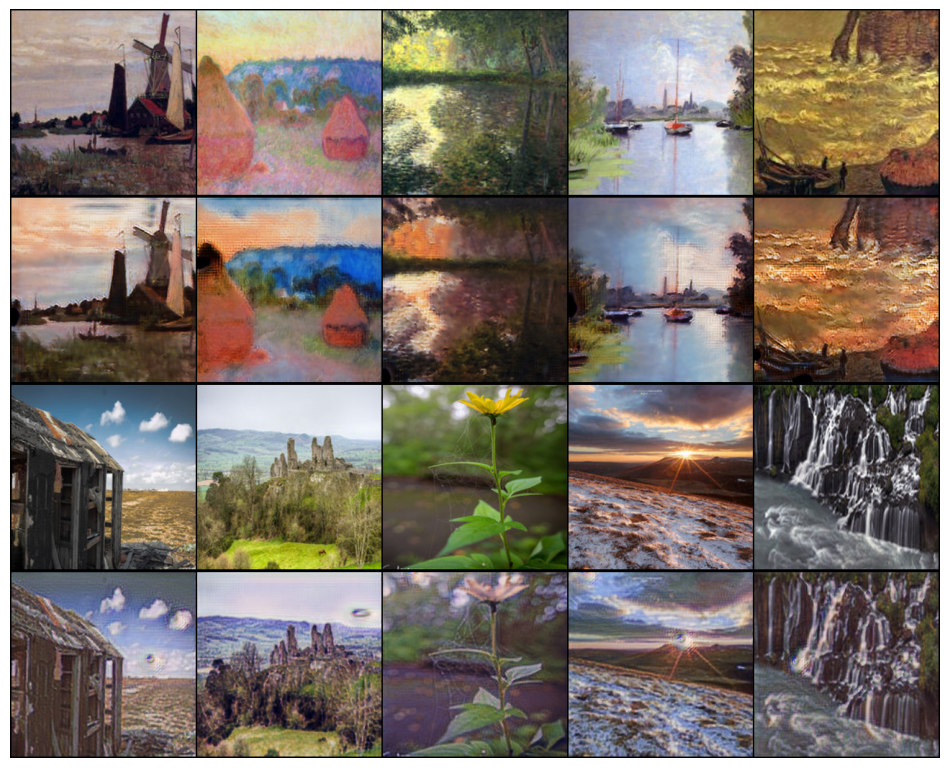

EPOCH: 2.000  loss_G: 3.475  loss_cycle: 0.204  loss_GAN: 0.512  loss_D: 0.199  loss_identity: 0.185  (7593.87s - 30375.49s remaining)
EPOCH: 3.000  loss_D: 0.401  loss_G: 3.376  loss_GAN: 0.805  loss_cycle: 0.169  loss_identity: 0.177  (11392.86s - 26583.33s remaining)

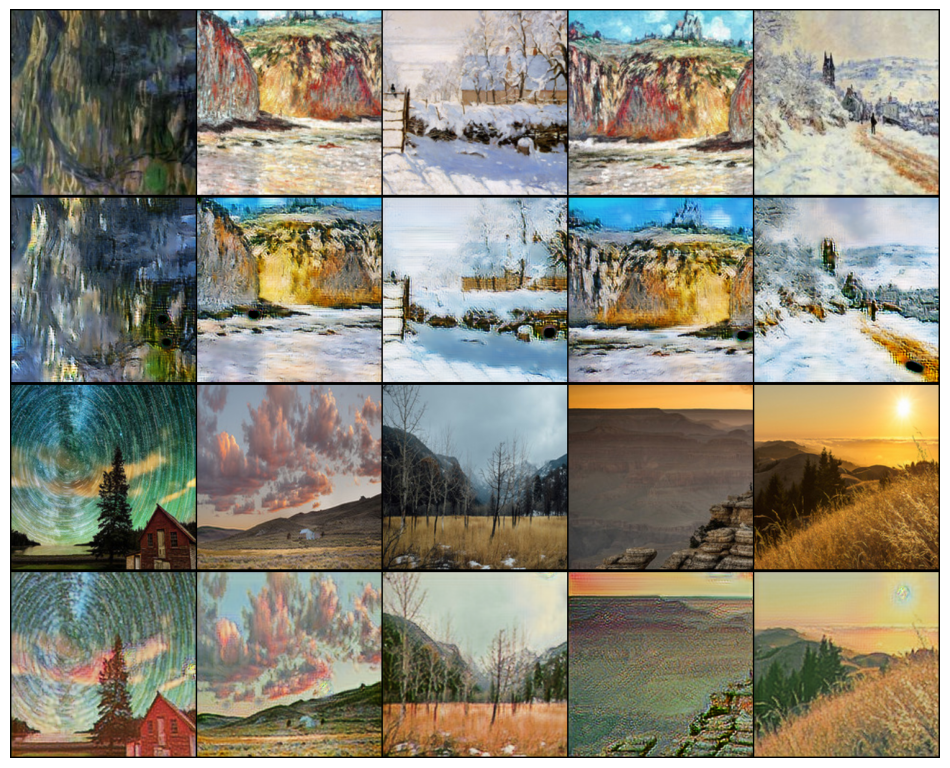

EPOCH: 3.000  loss_G: 3.224  loss_cycle: 0.186  loss_GAN: 0.507  loss_D: 0.197  loss_identity: 0.171  (11393.99s - 26585.98s remaining)
EPOCH: 4.000  loss_D: 0.215  loss_G: 2.225  loss_GAN: 0.390  loss_cycle: 0.133  loss_identity: 0.101  (15192.08s - 22788.12s remaining)

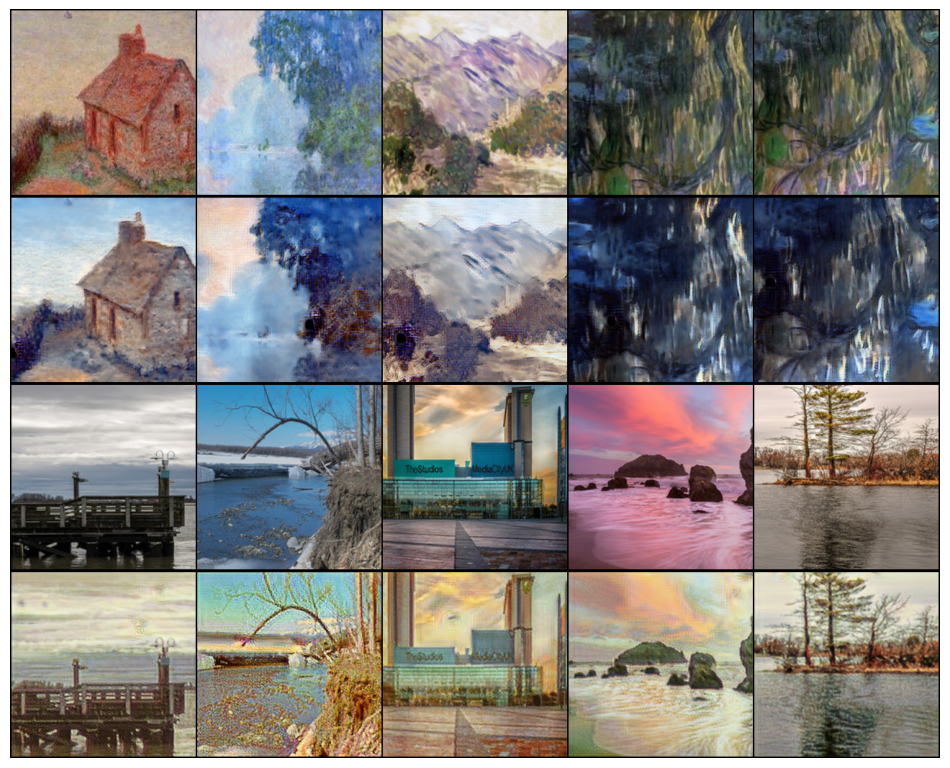

EPOCH: 4.000  loss_G: 3.121  loss_cycle: 0.177  loss_GAN: 0.537  loss_D: 0.184  loss_identity: 0.163  (15193.27s - 22789.90s remaining)
EPOCH: 5.000  loss_D: 0.040  loss_G: 5.023  loss_GAN: 0.822  loss_cycle: 0.273  loss_identity: 0.295  (18992.42s - 18992.42s remaining)

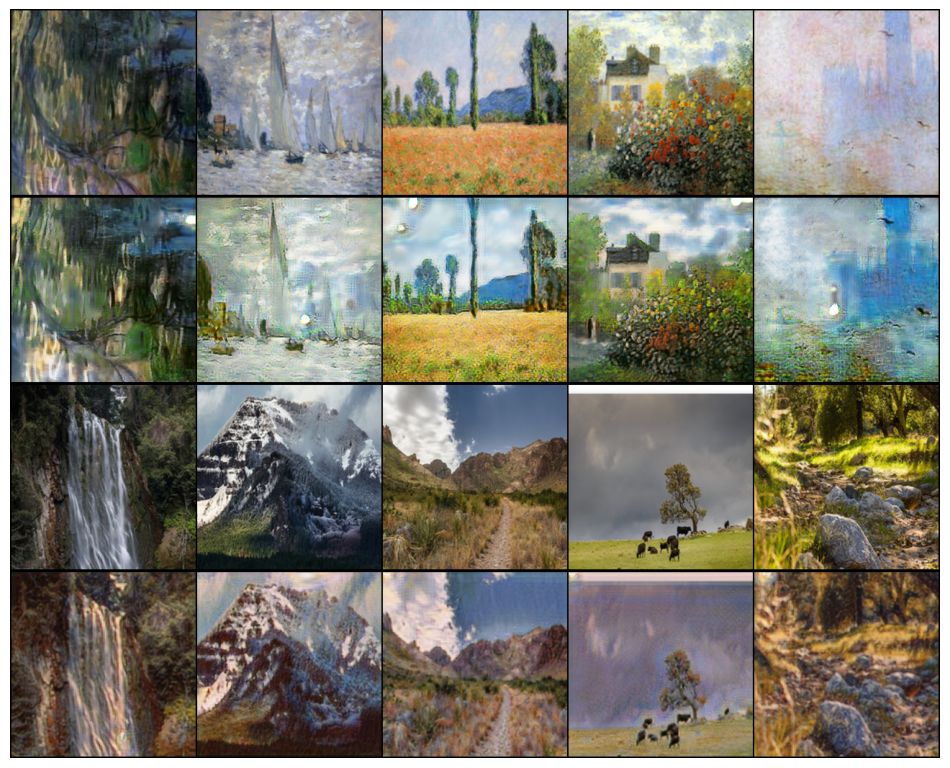

EPOCH: 5.000  loss_G: 3.059  loss_cycle: 0.171  loss_GAN: 0.556  loss_D: 0.175  loss_identity: 0.158  (18993.61s - 18993.61s remaining)
EPOCH: 6.000  loss_D: 0.095  loss_G: 3.826  loss_GAN: 0.570  loss_cycle: 0.247  loss_identity: 0.157  (22788.87s - 15192.58s remaining)

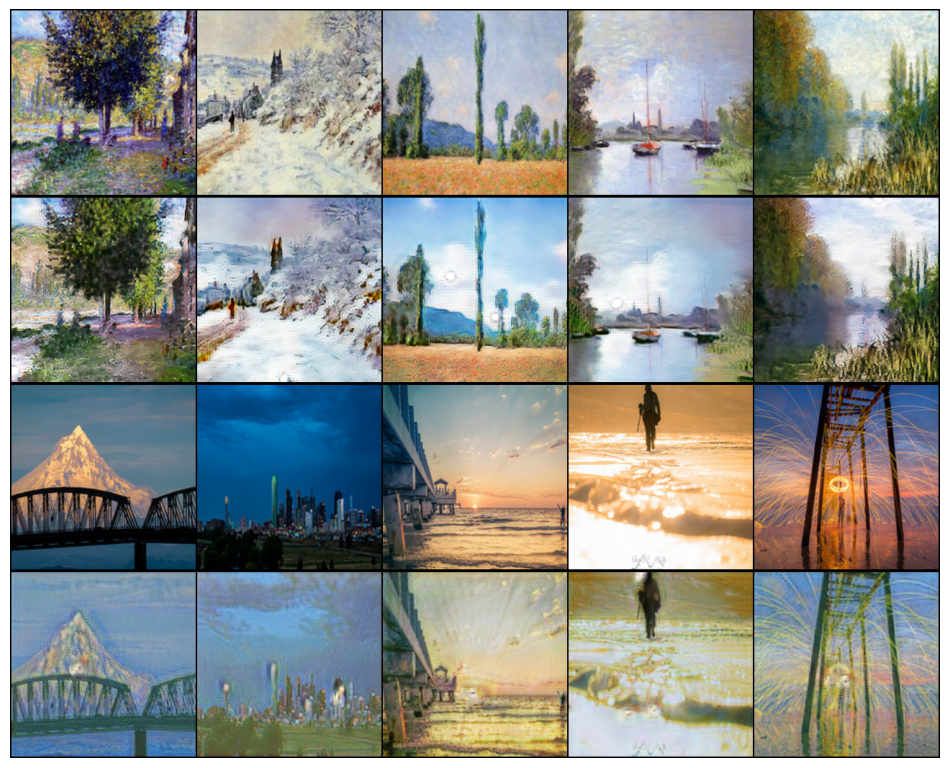

EPOCH: 6.000  loss_G: 3.083  loss_cycle: 0.171  loss_GAN: 0.593  loss_D: 0.161  loss_identity: 0.157  (22789.96s - 15193.30s remaining)
EPOCH: 7.000  loss_D: 0.156  loss_G: 2.533  loss_GAN: 0.385  loss_cycle: 0.152  loss_identity: 0.126  (26585.29s - 11393.70s remaining)

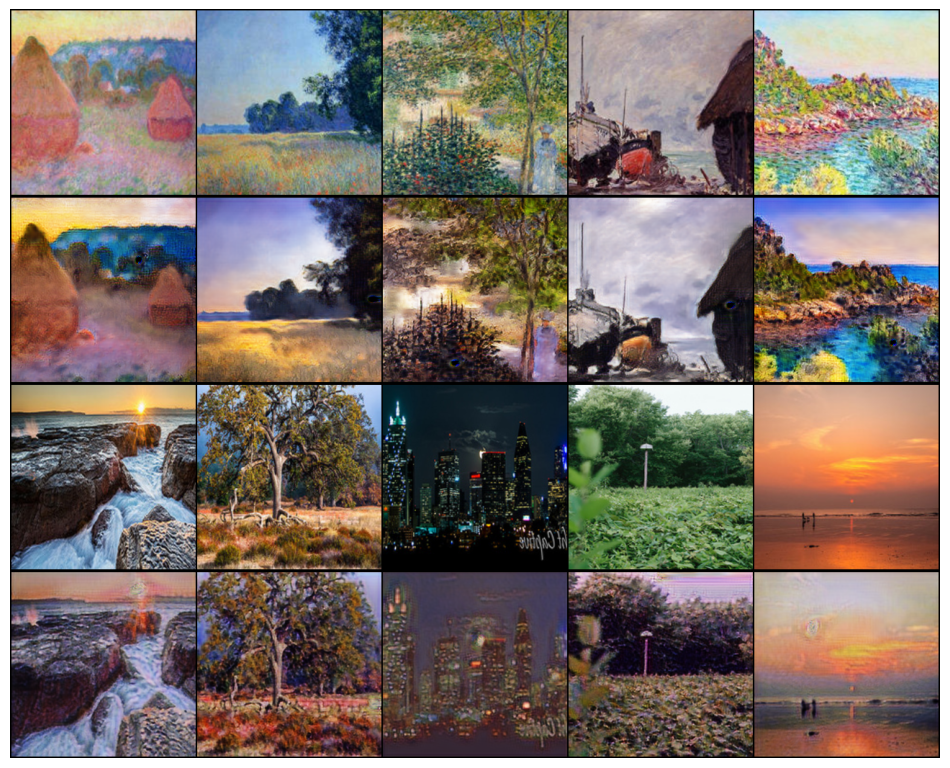

EPOCH: 7.000  loss_G: 3.013  loss_cycle: 0.167  loss_GAN: 0.582  loss_D: 0.164  loss_identity: 0.153  (26586.39s - 11394.17s remaining)
EPOCH: 8.000  loss_D: 0.114  loss_G: 3.034  loss_GAN: 0.926  loss_cycle: 0.138  loss_identity: 0.145  (30379.06s - 7594.77s remaining)

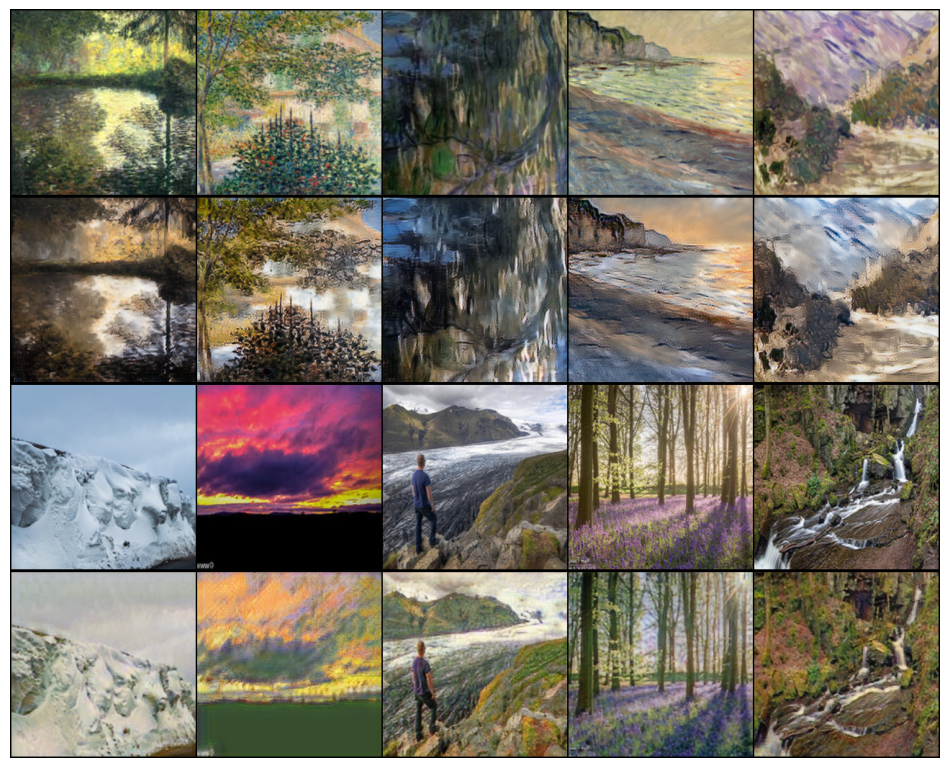

EPOCH: 8.000  loss_G: 2.869  loss_cycle: 0.160  loss_GAN: 0.533  loss_D: 0.180  loss_identity: 0.147  (30380.17s - 7595.04s remaining)
EPOCH: 9.000  loss_D: 0.245  loss_G: 2.503  loss_GAN: 0.550  loss_cycle: 0.133  loss_identity: 0.124  (34174.55s - 3797.17s remaining)

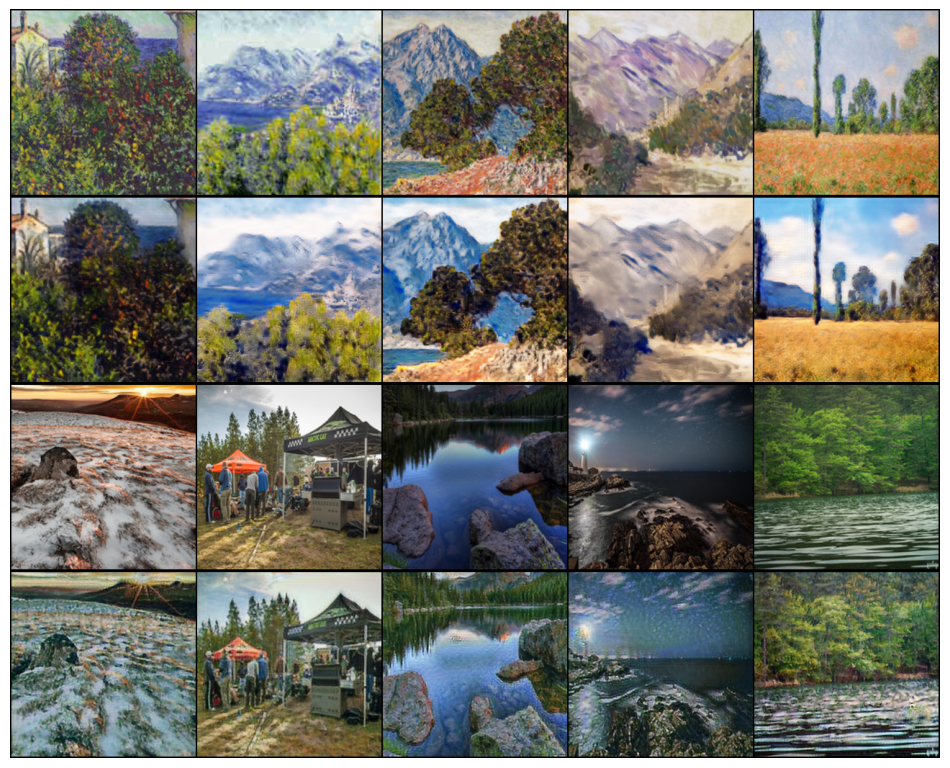

EPOCH: 9.000  loss_G: 2.798  loss_cycle: 0.155  loss_GAN: 0.530  loss_D: 0.179  loss_identity: 0.143  (34175.69s - 3797.30s remaining)
EPOCH: 10.000  loss_D: 0.177  loss_G: 3.438  loss_GAN: 0.835  loss_cycle: 0.185  loss_identity: 0.151  (37975.43s - 0.00s remaining)

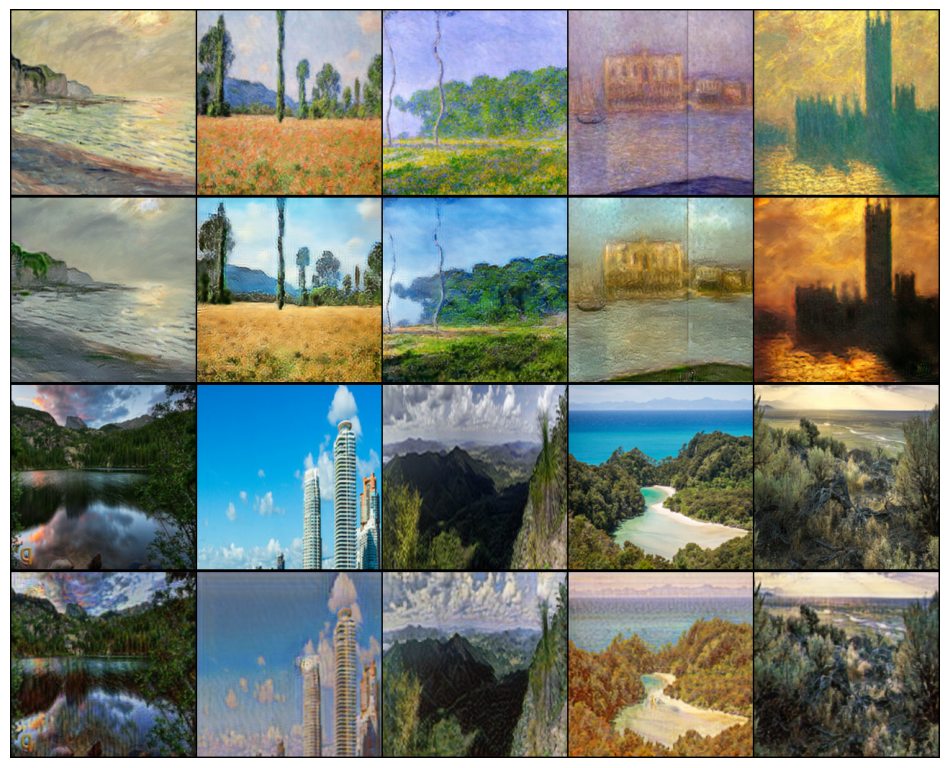

EPOCH: 10.000  loss_G: 2.770  loss_cycle: 0.153  loss_GAN: 0.540  loss_D: 0.174  loss_identity: 0.140  (37976.69s - 0.00s remaining)


In [18]:
n_epochs = 10
log = Report(n_epochs)
for epoch in range(n_epochs):
    N = len(trn_dl)
    for bx, batch in enumerate(trn_dl):
        real_A, real_B = batch

        loss_G, loss_identity, loss_GAN, loss_cycle, loss_G, fake_A, fake_B = generator_train_step((G_AB,G_BA), optimizer_G, real_A, real_B)
        loss_D_A = discriminator_train_step(D_A, real_A, fake_A, optimizer_D_A)
        loss_D_B = discriminator_train_step(D_B, real_B, fake_B, optimizer_D_B)
        loss_D = (loss_D_A + loss_D_B) / 2

        log.record(epoch+(1+bx)/N, loss_D=loss_D.item(), loss_G=loss_G.item(),
                   loss_GAN=loss_GAN.item(), loss_cycle=loss_cycle.item(),
                   loss_identity=loss_identity.item(), end='\r')
    generate_sample()

    log.report_avgs(epoch+1)

100%|██████████| 111/111 [00:07<00:00, 14.25it/s]


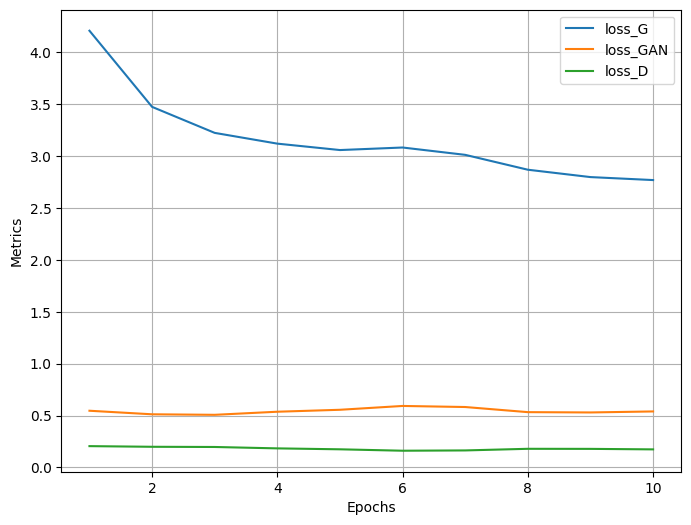

In [19]:
log.plot_epochs(['loss_G','loss_GAN', 'loss_D'])